## Linear Regression with SGD-Project 8

###  Importing required libraries

In [2]:
import os as os
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

In [3]:
os.getcwd()
pd.set_option('display.max_columns',None)

### Reading the dataset

In [4]:
os.chdir("C:\\Users\\archana\\Desktop\\DSP\\Py")
test= pd.read_csv("Property_Price_test.csv")
train= pd.read_csv("Property_Price_train.csv")

In [5]:
print("Training Set :",train.shape)
print("Testing Set :",test.shape)

Training Set : (1459, 81)
Testing Set : (1459, 80)


Droping Id column from both training and test data

In [6]:
train =train.drop('Id',axis=1)

In [7]:
test =test.drop('Id',axis=1)

Combining training and test datasets

In [8]:
alldata=train.append(test)

C:\Users\archana\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


In [9]:
alldata.shape
#df has 81 columns(79 feature +id and output var-SalePrice)
#it also has 1460 observartions

(2918, 80)

In [10]:
alldata=alldata.reset_index()

Seperating Numerical and Categorical features

In [11]:
df_num_features= alldata.select_dtypes(include=[np.number])
df_cat_features= alldata.select_dtypes(include=[np.object])
df_num_features

,index,Bedroom_Above_Grade,Brick_Veneer_Area,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,Building_Class,Construction_Year,Enclosed_Lobby_Area,Fireplaces,First_Floor_Area,Full_Bathroom_Above_Grade,Garage_Area,Garage_Built_Year,Garage_Size,Grade_Living_Area,Half_Bathroom_Above_Grade,House_Condition,Kitchen_Above_Grade,Lot_Extent,Lot_Size,LowQualFinSF,Miscellaneous_Value,Month_Sold,Open_Lobby_Area,Overall_Material,Pool_Area,Remodel_Year,Rooms_Above_Grade,Sale_Price,Screen_Lobby_Area,Second_Floor_Area,Three_Season_Lobby_Area,Total_Basement_Area,Underground_Full_Bathroom,Underground_Half_Bathroom,W_Deck_Area,Year_Sold
0,0,3,196.0,706.0,0.0,150.0,60,2003,20.337934,0,856,2,1085.793744,2003.0,2.0,1710,1,5,1,65.0,8450.000000,0,0,2,69.596115,7,0,2003,8,208500.0,0,854,0,856.0,1.0,0.0,163.788080,2008
1,1,3,0.0,978.0,0.0,284.0,20,1976,15.039392,1,1262,2,196.316304,1976.0,2.0,1262,0,8,1,80.0,9600.000000,0,0,5,74.716033,6,0,1976,6,181500.0,0,0,0,1262.0,0.0,1.0,198.900074,2007
2,2,3,162.0,486.0,0.0,434.0,60,2001,-46.232198,1,920,2,218.068403,2001.0,2.0,1786,1,5,1,68.0,11250.000000,0,0,9,32.085268,7,0,2002,6,223500.0,0,866,0,920.0,1.0,0.0,26.127533,2008
3,3,3,0.0,216.0,0.0,540.0,70,1915,60.921821,1,961,1,696.996439,1998.0,3.0,1717,0,5,1,60.0,9550.000000,0,0,2,40.181415,7,0,1970,7,140000.0,0,756,0,756.0,1.0,0.0,46.948018,2006
4,4,4,350.0,655.0,0.0,490.0,60,2000,21.788818,1,1145,2,568.859882,2000.0,3.0,2198,1,5,1,84.0,14260.000000,0,0,12,20.755323,8,0,2000,9,250000.0,0,1053,0,1145.0,1.0,0.0,-10.626105,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2913,1454,3,0.0,0.0,0.0,546.0,160,1970,0.000000,0,546,1,0.000000,NaN,0.0,1092,1,7,1,21.0,14584.838440,0,0,6,0.000000,4,0,1970,5,NaN,0,546,0,546.0,0.0,0.0,0.000000,2006
2914,1455,3,0.0,252.0,0.0,294.0,160,1970,0.000000,0,546,1,286.000000,1970.0,1.0,1092,1,5,1,21.0,8072.991379,0,0,4,24.000000,4,0,1970,6,NaN,0,546,0,546.0,0.0,0.0,0.000000,2006
2915,1456,4,0.0,1224.0,0.0,0.0,20,1960,0.000000,1,1224,1,576.000000,1960.0,2.0,1224,0,7,1,160.0,7367.775348,0,0,9,0.000000,5,0,1996,7,NaN,0,0,0,1224.0,1.0,0.0,474.000000,2006
2916,1457,3,0.0,337.0,0.0,575.0,85,1992,0.000000,0,970,1,0.000000,NaN,0.0,970,0,5,1,62.0,2203.135444,0,700,7,32.000000,5,0,1992,6,NaN,0,0,0,912.0,0.0,1.0,80.000000,2006


In [12]:
df_cat_features

,Air_Conditioning,Basement_Condition,Basement_Height,Brick_Veneer_Type,BsmtFinType1,BsmtFinType2,Condition1,Condition2,Electrical_System,Exposure_Level,Exterior1st,Exterior2nd,Exterior_Condition,Exterior_Material,Fence_Quality,Fireplace_Quality,Foundation_Type,Functional_Rate,Garage,Garage_Condition,Garage_Finish_Year,Garage_Quality,Heating_Quality,Heating_Type,House_Design,House_Type,Kitchen_Quality,Land_Outline,Lane_Type,Lot_Configuration,Miscellaneous_Feature,Neighborhood,Pavedd_Drive,Pool_Quality,Property_Shape,Property_Slope,Road_Type,Roof_Design,Roof_Quality,Sale_Condition,Sale_Type,Utility_Type,Zoning_Class
0,Y,TA,Gd,BrkFace,GLQ,Unf,Norm,Norm,SBrkr,No,VinylSd,VinylSd,TA,Gd,NaN,NaN,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,Gd,Lvl,NaN,I,NaN,CollgCr,Y,NaN,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
1,Y,TA,Gd,None,ALQ,Unf,Feedr,Norm,SBrkr,Gd,MetalSd,MetalSd,TA,TA,NaN,TA,CB,TF,Attchd,TA,RFn,TA,Ex,GasA,1Story,1Fam,TA,Lvl,NaN,FR2P,NaN,Veenker,Y,NaN,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
2,Y,TA,Gd,BrkFace,GLQ,Unf,Norm,Norm,SBrkr,Mn,VinylSd,VinylSd,TA,Gd,NaN,TA,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,Gd,Lvl,NaN,I,NaN,CollgCr,Y,NaN,IR1,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
3,Y,Gd,TA,None,ALQ,Unf,Norm,Norm,SBrkr,No,Wd Sdng,Wd Shng,TA,TA,NaN,Gd,BT,TF,Detchd,TA,Unf,TA,Gd,GasA,2Story,1Fam,Gd,Lvl,NaN,C,NaN,Crawfor,Y,NaN,IR1,GS,Paved,Gable,SS,Abnorml,WD,AllPub,RLD
4,Y,TA,Gd,BrkFace,GLQ,Unf,Norm,Norm,SBrkr,Av,VinylSd,VinylSd,TA,Gd,NaN,TA,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,Gd,Lvl,NaN,FR2P,NaN,NoRidge,Y,NaN,IR1,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2913,Y,TA,TA,None,Unf,Unf,NoRMD,NoRMD,SBrkr,No,CemntBd,CmentBd,TA,TA,NaN,NaN,CB,TF,NaN,NaN,NaN,NaN,Gd,GasA,2Story,Twnhs,TA,Lvl,NaN,I,NaN,MeadowV,Y,NaN,Reg,GS,Paved,Gable,SS,NoRMDal,WD,AllPub,RMD
2914,Y,TA,TA,None,Rec,Unf,NoRMD,NoRMD,SBrkr,No,CemntBd,CmentBd,TA,TA,NaN,NaN,CB,TF,CarPort,TA,Unf,TA,TA,GasA,2Story,TwnhsE,TA,Lvl,NaN,I,NaN,MeadowV,Y,NaN,Reg,GS,Paved,Gable,SS,AbnoRMDl,WD,AllPub,RMD
2915,Y,TA,TA,None,ALQ,Unf,Norm,Norm,SBrkr,No,VinylSd,VinylSd,TA,TA,NaN,TA,CB,TF,Detchd,TA,Unf,TA,Ex,GasA,1Story,1Fam,TA,Lvl,NaN,I,NaN,Mitchel,Y,NaN,Reg,GS,Paved,Gable,SS,Abnorml,WD,AllPub,RLD
2916,Y,TA,Gd,None,GLQ,Unf,Norm,Norm,SBrkr,Av,HdBoard,Wd Shng,TA,TA,MnPrv,NaN,PC,TF,NaN,NaN,NaN,NaN,TA,GasA,SFoyer,1Fam,TA,Lvl,NaN,I,Shed,Mitchel,Y,NaN,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD


### Handling Missing Values

In [13]:
missing= alldata.isnull().sum().sort_values(ascending = False)
missing

Pool_Quality             2908
Miscellaneous_Feature    2813
Lane_Type                2720
Fence_Quality            2347
Sale_Price               1459
                         ... 
House_Design                0
House_Condition             0
Year_Sold                   0
Heating_Quality             0
index                       0
Length: 81, dtype: int64

In [14]:
pd.set_option('display.max_rows',None)

In [15]:
missing.shape

(81,)

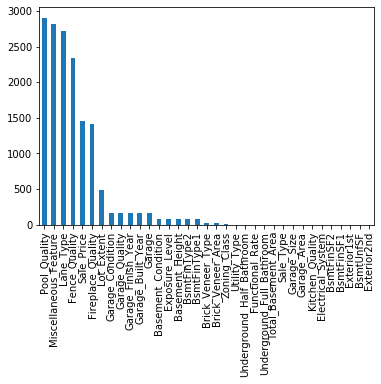

In [16]:
missing=missing[missing>0]
missing.plot.bar()

In [17]:
alldata.fillna(alldata.median(),inplace=True)

After filling missing values with median, checking again. Still missing values are found, which refers to the missing values in categorical features

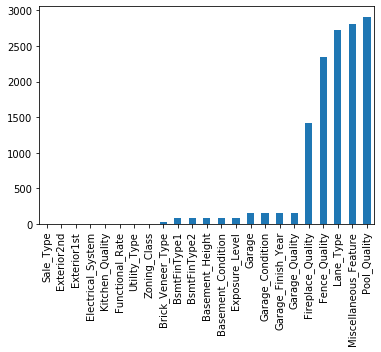

In [18]:
missing= alldata.isnull().sum().sort_values(ascending = False)
missing=missing[missing>0]
missing.sort_values(inplace=True)
missing.plot.bar()

Filling categorical features missing value with 'None'

In [19]:
cols_fillna = ['Pool_Quality','Miscellaneous_Feature','Lane_Type','Fence_Quality','Brick_Veneer_Type','Fireplace_Quality',
               'Garage_Quality','Garage_Condition', 'Electrical_System','Garage_Finish_Year', 
               'Exposure_Level','Basement_Condition','Basement_Height','BsmtFinType1','BsmtFinType2','Garage','Zoning_Class','Functional_Rate',
               'Utility_Type','Exterior1st','Sale_Type','Exterior2nd','Kitchen_Quality','Electrical_System']

for col in cols_fillna:
    alldata[col].fillna('None',inplace=True)

In [20]:
df_num_features= alldata.select_dtypes(include=[np.number])
df_cat_features= alldata.select_dtypes(include=[np.object])
df_num_features

,index,Bedroom_Above_Grade,Brick_Veneer_Area,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,Building_Class,Construction_Year,Enclosed_Lobby_Area,Fireplaces,First_Floor_Area,Full_Bathroom_Above_Grade,Garage_Area,Garage_Built_Year,Garage_Size,Grade_Living_Area,Half_Bathroom_Above_Grade,House_Condition,Kitchen_Above_Grade,Lot_Extent,Lot_Size,LowQualFinSF,Miscellaneous_Value,Month_Sold,Open_Lobby_Area,Overall_Material,Pool_Area,Remodel_Year,Rooms_Above_Grade,Sale_Price,Screen_Lobby_Area,Second_Floor_Area,Three_Season_Lobby_Area,Total_Basement_Area,Underground_Full_Bathroom,Underground_Half_Bathroom,W_Deck_Area,Year_Sold
0,0,3,196.0,706.0,0.0,150.0,60,2003,20.337934,0,856,2,1085.793744,2003.0,2.0,1710,1,5,1,65.0,8450.000000,0,0,2,69.596115,7,0,2003,8,208500.0,0,854,0,856.0,1.0,0.0,163.788080,2008
1,1,3,0.0,978.0,0.0,284.0,20,1976,15.039392,1,1262,2,196.316304,1976.0,2.0,1262,0,8,1,80.0,9600.000000,0,0,5,74.716033,6,0,1976,6,181500.0,0,0,0,1262.0,0.0,1.0,198.900074,2007
2,2,3,162.0,486.0,0.0,434.0,60,2001,-46.232198,1,920,2,218.068403,2001.0,2.0,1786,1,5,1,68.0,11250.000000,0,0,9,32.085268,7,0,2002,6,223500.0,0,866,0,920.0,1.0,0.0,26.127533,2008
3,3,3,0.0,216.0,0.0,540.0,70,1915,60.921821,1,961,1,696.996439,1998.0,3.0,1717,0,5,1,60.0,9550.000000,0,0,2,40.181415,7,0,1970,7,140000.0,0,756,0,756.0,1.0,0.0,46.948018,2006
4,4,4,350.0,655.0,0.0,490.0,60,2000,21.788818,1,1145,2,568.859882,2000.0,3.0,2198,1,5,1,84.0,14260.000000,0,0,12,20.755323,8,0,2000,9,250000.0,0,1053,0,1145.0,1.0,0.0,-10.626105,2008
5,5,1,0.0,732.0,0.0,64.0,50,1993,70.350362,0,796,1,703.481359,1993.0,2.0,1362,1,5,1,85.0,14115.000000,0,700,10,36.740335,5,0,1995,5,143000.0,0,566,320,796.0,1.0,0.0,0.621402,2009
6,6,3,186.0,1369.0,0.0,317.0,20,2004,-7.064622,1,1694,2,555.415694,2004.0,2.0,1694,0,5,1,75.0,10084.000000,0,0,8,118.613457,8,0,2005,7,307000.0,0,0,0,1686.0,1.0,0.0,39.047177,2007
7,7,3,240.0,859.0,32.0,216.0,60,1973,76.923944,2,1107,2,737.632993,1973.0,2.0,2090,1,6,1,68.0,10382.000000,0,350,11,150.621507,7,0,1973,7,200000.0,0,983,0,1107.0,1.0,0.0,201.101046,2009
8,8,2,0.0,0.0,0.0,952.0,50,1931,78.563161,2,1022,2,424.620043,1931.0,2.0,1774,0,5,2,51.0,6120.000000,0,0,4,57.933986,7,0,1950,8,129900.0,0,752,0,952.0,0.0,0.0,-24.044684,2008
9,9,2,0.0,851.0,0.0,140.0,190,1939,57.757631,2,1077,1,632.539240,1939.0,1.0,1077,0,6,2,50.0,7420.000000,0,0,1,59.827696,5,0,1950,5,118000.0,0,0,0,991.0,1.0,0.0,31.123219,2008


In [21]:
df_cat_features

,Air_Conditioning,Basement_Condition,Basement_Height,Brick_Veneer_Type,BsmtFinType1,BsmtFinType2,Condition1,Condition2,Electrical_System,Exposure_Level,Exterior1st,Exterior2nd,Exterior_Condition,Exterior_Material,Fence_Quality,Fireplace_Quality,Foundation_Type,Functional_Rate,Garage,Garage_Condition,Garage_Finish_Year,Garage_Quality,Heating_Quality,Heating_Type,House_Design,House_Type,Kitchen_Quality,Land_Outline,Lane_Type,Lot_Configuration,Miscellaneous_Feature,Neighborhood,Pavedd_Drive,Pool_Quality,Property_Shape,Property_Slope,Road_Type,Roof_Design,Roof_Quality,Sale_Condition,Sale_Type,Utility_Type,Zoning_Class
0,Y,TA,Gd,BrkFace,GLQ,Unf,Norm,Norm,SBrkr,No,VinylSd,VinylSd,TA,Gd,None,None,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,Gd,Lvl,None,I,None,CollgCr,Y,None,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
1,Y,TA,Gd,None,ALQ,Unf,Feedr,Norm,SBrkr,Gd,MetalSd,MetalSd,TA,TA,None,TA,CB,TF,Attchd,TA,RFn,TA,Ex,GasA,1Story,1Fam,TA,Lvl,None,FR2P,None,Veenker,Y,None,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
2,Y,TA,Gd,BrkFace,GLQ,Unf,Norm,Norm,SBrkr,Mn,VinylSd,VinylSd,TA,Gd,None,TA,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,Gd,Lvl,None,I,None,CollgCr,Y,None,IR1,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
3,Y,Gd,TA,None,ALQ,Unf,Norm,Norm,SBrkr,No,Wd Sdng,Wd Shng,TA,TA,None,Gd,BT,TF,Detchd,TA,Unf,TA,Gd,GasA,2Story,1Fam,Gd,Lvl,None,C,None,Crawfor,Y,None,IR1,GS,Paved,Gable,SS,Abnorml,WD,AllPub,RLD
4,Y,TA,Gd,BrkFace,GLQ,Unf,Norm,Norm,SBrkr,Av,VinylSd,VinylSd,TA,Gd,None,TA,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,Gd,Lvl,None,FR2P,None,NoRidge,Y,None,IR1,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
5,Y,TA,Gd,None,GLQ,Unf,Norm,Norm,SBrkr,No,VinylSd,VinylSd,TA,TA,MnPrv,None,W,TF,Attchd,TA,Unf,TA,Ex,GasA,1.5Fin,1Fam,TA,Lvl,None,I,Shed,Mitchel,Y,None,IR1,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
6,Y,TA,Ex,Stone,GLQ,Unf,Norm,Norm,SBrkr,Av,VinylSd,VinylSd,TA,Gd,None,Gd,PC,TF,Attchd,TA,RFn,TA,Ex,GasA,1Story,1Fam,Gd,Lvl,None,I,None,Somerst,Y,None,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
7,Y,TA,Gd,Stone,ALQ,BLQ,PosN,Norm,SBrkr,Mn,HdBoard,HdBoard,TA,TA,None,TA,CB,TF,Attchd,TA,RFn,TA,Ex,GasA,2Story,1Fam,TA,Lvl,None,C,Shed,NWAmes,Y,None,IR1,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD
8,Y,TA,TA,None,Unf,Unf,Artery,Norm,FuseF,No,BrkFace,Wd Shng,TA,TA,None,TA,BT,MD1,Detchd,TA,Unf,Fa,Gd,GasA,1.5Fin,1Fam,TA,Lvl,None,I,None,OldTown,Y,None,Reg,GS,Paved,Gable,SS,Abnorml,WD,AllPub,RMD
9,Y,TA,TA,None,GLQ,Unf,Artery,Artery,SBrkr,No,MetalSd,MetalSd,TA,TA,None,TA,BT,TF,Attchd,TA,RFn,Gd,Ex,GasA,1.5Unf,2fmCon,TA,Lvl,None,C,None,BrkSide,Y,None,Reg,GS,Paved,Gable,SS,Normal,WD,AllPub,RLD


In [22]:
df_cat_features.columns

Index(['Air_Conditioning', 'Basement_Condition', 'Basement_Height',
       'Brick_Veneer_Type', 'BsmtFinType1', 'BsmtFinType2', 'Condition1',
       'Condition2', 'Electrical_System', 'Exposure_Level', 'Exterior1st',
       'Exterior2nd', 'Exterior_Condition', 'Exterior_Material',
       'Fence_Quality', 'Fireplace_Quality', 'Foundation_Type',
       'Functional_Rate', 'Garage', 'Garage_Condition', 'Garage_Finish_Year',
       'Garage_Quality', 'Heating_Quality', 'Heating_Type', 'House_Design',
       'House_Type', 'Kitchen_Quality', 'Land_Outline', 'Lane_Type',
       'Lot_Configuration', 'Miscellaneous_Feature', 'Neighborhood',
       'Pavedd_Drive', 'Pool_Quality', 'Property_Shape', 'Property_Slope',
       'Road_Type', 'Roof_Design', 'Roof_Quality', 'Sale_Condition',
       'Sale_Type', 'Utility_Type', 'Zoning_Class'],
      dtype='object')

### Scaling data using MinMaxScaler

In [33]:
df_num_features.shape

(2918, 38)

In [24]:
from sklearn.preprocessing import MinMaxScaler
min_max = MinMaxScaler()

df_housingdata_numcols=pd.DataFrame(min_max.fit_transform(df_num_features.iloc[:,0:36]),
            columns=df_num_features.iloc[:,0:36].columns.tolist()) 
#36 because, there are 38 columns in df_num_features.shape, of which 2 are related to index
#so we need to Scale for 36 columns


In [25]:
df_housingdata_numcols.head()

,index,Bedroom_Above_Grade,Brick_Veneer_Area,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,Building_Class,Construction_Year,Enclosed_Lobby_Area,Fireplaces,First_Floor_Area,Full_Bathroom_Above_Grade,Garage_Area,Garage_Built_Year,Garage_Size,Grade_Living_Area,Half_Bathroom_Above_Grade,House_Condition,Kitchen_Above_Grade,Lot_Extent,Lot_Size,LowQualFinSF,Miscellaneous_Value,Month_Sold,Open_Lobby_Area,Overall_Material,Pool_Area,Remodel_Year,Rooms_Above_Grade,Sale_Price,Screen_Lobby_Area,Second_Floor_Area,Three_Season_Lobby_Area,Total_Basement_Area,Underground_Full_Bathroom,Underground_Half_Bathroom
0,0.000000,0.375,0.12250,0.125089,0.0,0.064212,0.235294,0.949275,0.157328,0.00,0.109641,0.50,0.751321,0.346154,0.4,0.259231,0.5,0.500,0.333333,0.150685,0.057925,0.0,0.0,0.090909,0.276324,0.666667,0.0,0.883333,0.461538,0.241078,0.0,0.413559,0.0,0.140098,0.333333,0.0
1,0.000686,0.375,0.00000,0.173281,0.0,0.121575,0.000000,0.753623,0.152826,0.25,0.194917,0.50,0.201368,0.259615,0.4,0.174830,0.0,0.875,0.333333,0.202055,0.063164,0.0,0.0,0.363636,0.281834,0.555556,0.0,0.433333,0.307692,0.203583,0.0,0.000000,0.0,0.206547,0.000000,0.5
2,0.001372,0.375,0.10125,0.086109,0.0,0.185788,0.235294,0.934783,0.100760,0.25,0.123083,0.50,0.214817,0.339744,0.4,0.273549,0.5,0.500,0.333333,0.160959,0.070681,0.0,0.0,0.727273,0.235952,0.666667,0.0,0.866667,0.307692,0.261908,0.0,0.419370,0.0,0.150573,0.333333,0.0
3,0.002058,0.375,0.00000,0.038271,0.0,0.231164,0.294118,0.311594,0.191815,0.25,0.131695,0.25,0.510932,0.330128,0.6,0.260550,0.0,0.500,0.333333,0.133562,0.062936,0.0,0.0,0.090909,0.244666,0.666667,0.0,0.333333,0.384615,0.145952,0.0,0.366102,0.0,0.123732,0.333333,0.0
4,0.002743,0.500,0.21875,0.116052,0.0,0.209760,0.235294,0.927536,0.158561,0.25,0.170342,0.50,0.431707,0.336538,0.6,0.351168,0.5,0.500,0.333333,0.215753,0.084393,0.0,0.0,1.000000,0.223759,0.777778,0.0,0.833333,0.538462,0.298709,0.0,0.509927,0.0,0.187398,0.333333,0.0


#### One hot encoding on Categorical Variables

In [26]:
for col in df_cat_features.columns.values:
    one_hot = pd.get_dummies(df_cat_features[col],prefix=col)
    df_cat_features = pd.concat([df_cat_features,one_hot],axis=1)
    df_cat_features.drop([col],axis=1,inplace=True)

In [27]:
df_housedata = pd.concat([df_housingdata_numcols,df_cat_features],axis=1)

### Creating Training and Testing datasets using sklean train_test_split

In [28]:
from sklearn.model_selection import train_test_split
X= df_housedata.drop('Sale_Price',axis=1)
Y= df_housedata['Sale_Price']

from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.3)
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(2042, 318) (876, 318) (2042,) (876,)


In [29]:
import numpy as np
from sklearn.linear_model import SGDRegressor
lin_model = SGDRegressor()
lin_model.fit(x_train,y_train)
lin_model_predictions=lin_model.predict(x_test)
#we check` coefficient of determination using score()
print(lin_model.score(x_test,y_test))

0.3971933580802591


Coefficient of determination tells us about the goodness of fit of a model.
Coefficient of determination = 0.397, signifies that a variable can explain only 0.397 variance in o/p variable.This is mainly due to correlation b/w independent variables.

### Root Mean Square Error

In [30]:
# we check the root mean square error (RMSE)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, lin_model_predictions)
rmse = np.sqrt(mse)
print(rmse)


0.06330717062707868


RMSE means total loss (squareroot of diff between the actual and predicted value).
Smaller RMSE, better the model

### LM without SGD

In [40]:
import numpy as np
from sklearn.linear_model import LinearRegression
lin_reg_model = LinearRegression()
lin_reg_model.fit(x_train,y_train)
lin_reg_model_predictions=lin_reg_model.predict(x_test)
#we check coefficient of determination using score()
print(lin_reg_model.score(x_test,y_test))

-1.4499806247231875e+20


In [41]:
# we check the root mean square error (RMSE)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, lin_reg_model_predictions)
rmse = np.sqrt(mse)
print(rmse)


981849649.032265


The very low coefficient of determination and very high RMSE, the linear model without SGD is very bad model